#Submission for **Dastoon** Problem Statement for **Engineer, Generative AI**
Here is the link of the [problem statement](https://dashtoon.notion.site/Engineer-Generative-AI-ca79a87773e54d769436cec05282e11e)


PS in brief:
> The aim of this assignment is to create a deep learning model capable of adapting an existing work to resemble the aesthetic of any art. The model should be able to analyze the artistic style of the selected art and apply similar stylistic features to a new, original artwork, creating a piece that seems as though it could have been created by the artist themselves.

The problem statement is closely related to the well known task called **Neural style transfer** aka **NST**

Description of NST:
> Neural style transfer (NST) refers to a class of software algorithms that manipulate digital images, or videos, in order to adopt the appearance or visual style of another image.

Similarly, for this problem statement, we were asked to apply the Artestic style of selected art (Style image) and apply similar stylistic feature to a new Image (Content image)


#**NST - Neural Style Transfer**

##Introduction
Neural Style Transfer (NST) is a fascinating application of deep learning that combines the content of one image with the style of another. This technique has gained popularity for creating artistic and visually appealing images. In this report, we will explore the implementation of NST using the VGG19 model.


#IMAGe

##**Overview**
NST leverages the representations learned by a convolutional neural network (CNN) to separate and recombine content and style from different images. The basic idea is to define a content loss and a style loss, which are then minimized to generate a new image that preserves the content of one image and the style of another.


In this Jupyter notebook, I have tried implementing first paper on NST: **A Neural Algorithm of Artistic Style** by *Leon Gatys et al.* with minor changes and imporvements to enchance the output of the model

To make the model faster and more accurate, a **pre-trained** **VGG-Net-19** (Visual Geometry Group) is used. The model is trained on ImageNet images and can be downloaded from Pytorch API.

Some important Distinction for the understanding:




*   A content image (c) — the image we want to transfer a style to
*   A style image (s) — the image we want to transfer the style from
*   An input (generated) image (g) — the image that contains the final result *(the only trainable variable)*


##**Flow**
![Flow](https://pluralsight2.imgix.net/guides/6aea867b-bac9-4e3f-b1cd-eabc5c432d25_2.jpg)

## **Importing Libraries:**
Here I have implemeted the task using **Pytorch API** and other Image processing libraries such as **PIL (Pillow)** and mathematical library such as **Numpy**

In [1]:
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

## **Downloading a Pre-trained VGG19 model**
Here I am using the pre-trained VGG19 model. The model is trained on ImageNet images. And freezing the parameters.

In [2]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:05<00:00, 113MB/s] 


In [3]:
# Printing the model
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## **UTILS:**
I recommand you to use a Cuda diver for faster computation and if you dont have a local GPU access you can use Google Colab's free GPU

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("We are currently using: ",device)

We are currently using:  cuda


### **Image Loader**
`load_image():`


> This functions have parameters:
>*   img_path : the local or relative path of the image to load
>*   max_size : Setting the maximum size of the image to 400px for computatonal reasons
>*  shape : the shape of the image
>
> This Function import the image from the given path and apply the necessary transformations to the image which includes resizing the image, converting the pixel values to Tensor and Normalizing the image
>
> This Function returns the Image tensor


---


In [5]:
def load_image(img_path, max_size=400, shape=None):
    image=Image.open(img_path)
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

### **Image converter**
`im_convert()`:
> This functions have parameters:
>*   tensor : The image tensor
>
> This function is used to convert back the normalized tensor to an numpy array
>
> The Function returns the Unormalized image array
---


In [6]:
def im_convert(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

### **Get Feature**
`get_features():`
> This functions have parameters:
>*   image : The image tensor
>*   model : The neural net
>*   layers: The name of the specfic layer of the neural Net
>
> This function takes inspiration from the Paper which i have read above, in this paper we are sampling the specific layers of the neural net for our task specially the first layers of each blocks of the VGG19, namely: `‘conv1_1’` , `‘conv2_1’` , `‘conv3_1’` , `‘conv4_1’` ,  `‘conv5_1’` and `‘conv5_2’`
>
> And then pass the image through each layer append it in a dict names `features`
>
> The Function returns the dict `features`
---
### Note
Intermediate Layers for Style and Content

Deeper layers of VGG-19 will extract the best and most complex features. Hence, conv5_2 is assigned to extract content components. From each block, the first convolution layers (shallow layers) i.e. from conv1_1 to conv5_1 detects multiple features like lines or edges. Refer to the image below.

![VGG Net](https://github.com/morancium/utils/blob/main/vgg.png)

The layers Highlighted in the Yellow are used for Style Feature Extraction and the layer which is Highlighted in Blue is used for content Feature Extraction

**One Important Note**

Here I am using the last layer of the last Convolution block for the computation of the loss fucntion whereas in the paper author have used every first layer of each block for the computation of the loss function

In [7]:
def get_features(image, model, layers=None):

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '30': 'conv5_2', #content
                  '28': 'conv5_1'}

    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features

### Gram Matrix calculation
`gram_matrix()`
> This functions have parameters:
>*   tensor : the tensor of which we want to compute the Gram matrix
>
> The Function returns the Gram matrix of the input tensor

In [8]:
def gram_matrix(tensor):

    _, d, h, w = tensor.size()

    tensor = tensor.view(d, h * w)

    gram = torch.mm(tensor, tensor.t())

    return gram

### Loading the model in GPU memory

In [9]:
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

### Displaying the Content and Style Image

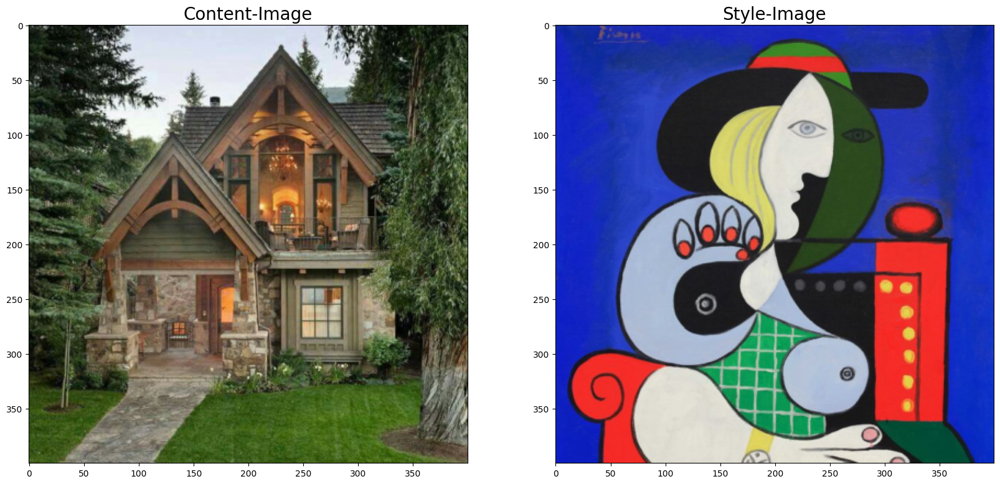

In [10]:
style = load_image("picaso.jpg").to(device)
content  = load_image("house.jpg").to(device)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title("Content-Image",fontsize = 20)
ax2.imshow(im_convert(style))
ax2.set_title("Style-Image", fontsize = 20)
plt.show()

## Setting up some important variables

In [11]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# Producing the gram matrix for every feature layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# setting the clone of the content image as Target image
target = content.clone().requires_grad_(True).to(device)

## Hyperparams
Here we are setting the number of iteration as `steps=7000`
*   `α = 0.01` --> Content weight
*   `β = 10^7` --> Style Weight
*   `lr = 0.001` --> Learning Rate

We can also set up the individual weights for the feature layer for the loss computation, in the paper they have set the each weight as equal to one divided by the number of active layers with a non-zero loss-weight that is 0.2 in this case

In [12]:
show = 400
steps = 7000
lr=0.001
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.2,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 0.01 #aplha
style_weight = 1e7 #Beta

## Setting up the optimizer

In [13]:
optimizer = optim.Adam([target], lr=lr)
# Other optimizers can be experimented especially the LBFGS optimeizer which can be faster than the Adam

## **Traing LOOP**

### **LOSS CALCULATION**
Let's talk about the loss calculation first!!

The final Loss function can be divided as the sum of two loss functions, namely `Content Loss` and `Style Loss`

#### **Content Loss**:
>* The content loss function ensures that the activations of the higher layers are similar between the content image and the generated image.
>
> As Discussed it the paper:
>
>* It is intuitive that higher layers of the model focus more on the features present in the image i.e. overall content of the image.
>* Content loss is calculated by Euclidean distance between the respective intermediate higher-level feature representation of input image(x) and content image(p) at layer l.
> ## IMAGHE
>* It is natural for a model to produce different feature maps in higher layers being activated in the presence of different objects.
>
>This helps us to deduce that images having the same content should also have similar activations in the higher layers.

#### **Style Loss**:
>* The style loss function makes sure that the correlation of activations in all the layers are similar between the style image and the generated image.
>* Style loss is conceptually different from Content loss.
>* We cannot just compare the intermediate features of the two images and get the style loss. That is why we have computed the GRAM matrix of the feature map.
>* Gram matrix is a way to interpret style information in an image as it shows the overall distribution of features in a given layer. It is measured as the amount of correlation present between features maps in a given layer.
>* Style loss is calculated by the distance between the gram matrices (or, in other terms, style representation) of the generated image and the style reference image.
> ## IMG
>where the contribution of each layer in the style loss is depicted by some factor wl.


### **What's Happening in the training Loop??**
`train()`
> This functions have parameters:
>*   style_weights : the individual weight for the loss computation


we are computing the Content and Style loss and using the Adam Optimizer for backprop for `steps` number of iterations and printing loss and showing the target image every `show`th step

you can uncomment the 16th and 19th line and also commenting the 6th and 18th line for the exact implemetation of the paper

In [14]:
def train(style_weights):
  for i in range(1, steps+1):

    target_features = get_features(target, vgg)

    content_loss = torch.mean((target_features['conv5_2'] - content_features['conv5_2'])**2)
    content_loss_fl=0
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_loss += layer_style_loss / (d * h * w)
        # content_loss_fl += torch.mean((target_features[layer] - content_features[layer])**2)

    total_loss = content_weight * content_loss + style_weight * style_loss
    # total_loss_fl = content_weight * content_loss_fl + style_weight * style_loss
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if  i % show == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

Total loss:  1638605952.0


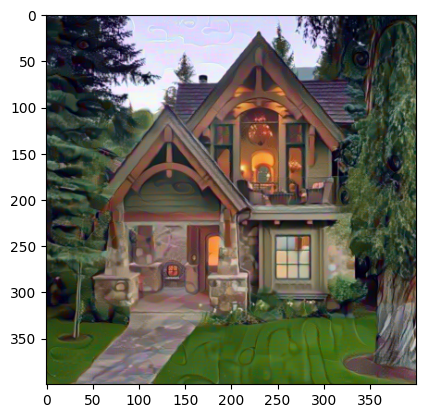

Total loss:  1075558272.0


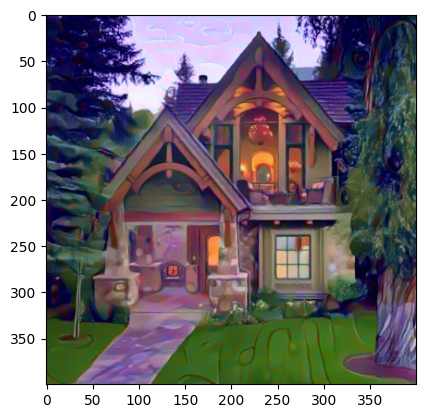

Total loss:  407479776.0


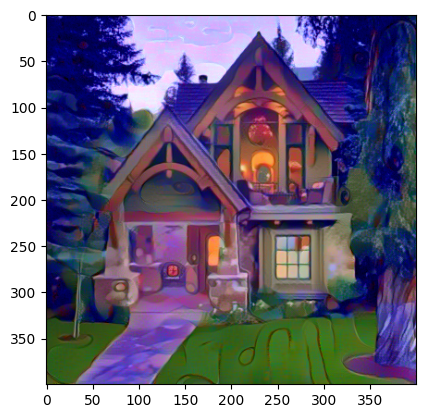

Total loss:  148705488.0


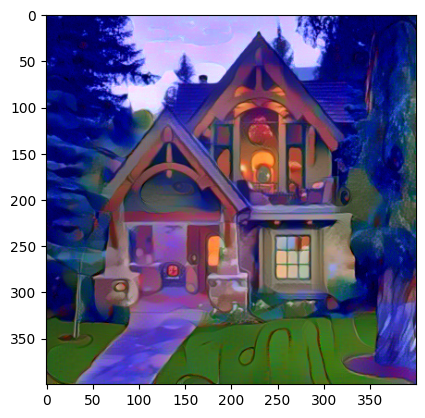

Total loss:  88674800.0


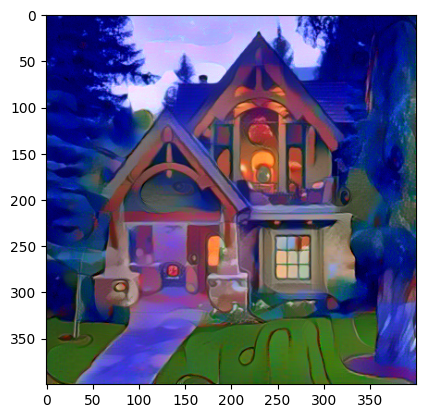

Total loss:  67310952.0


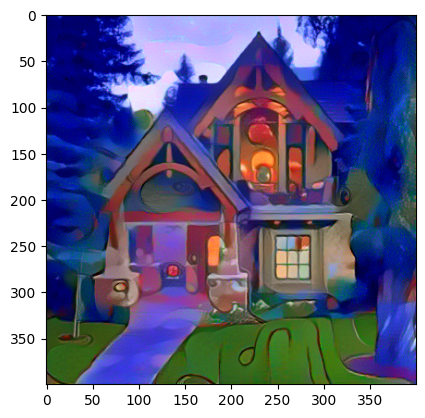

Total loss:  53875236.0


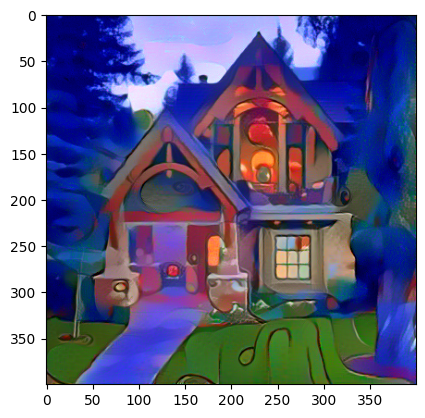

Total loss:  43547808.0


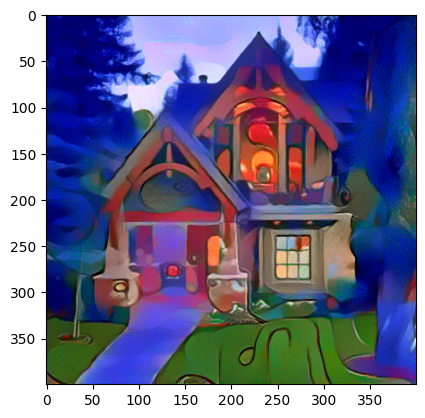

Total loss:  35105684.0


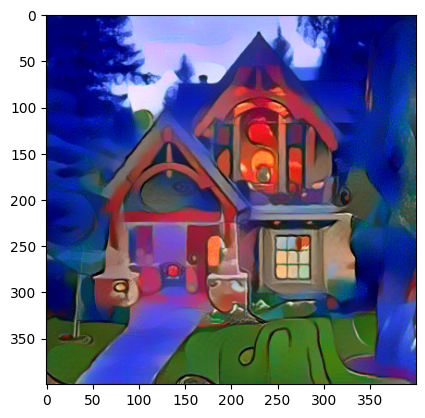

Total loss:  28143836.0


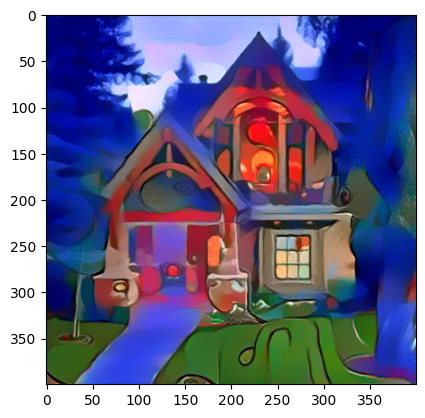

Total loss:  22636138.0


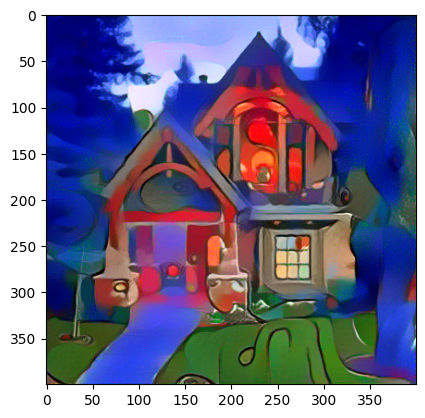

Total loss:  18446204.0


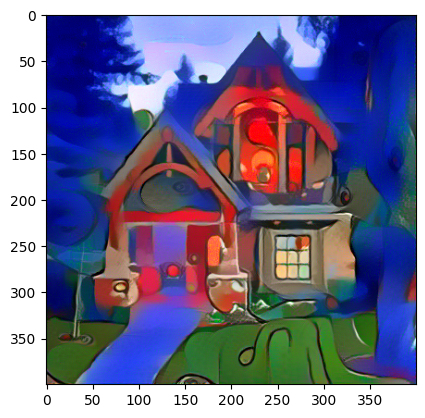

Total loss:  15332963.0


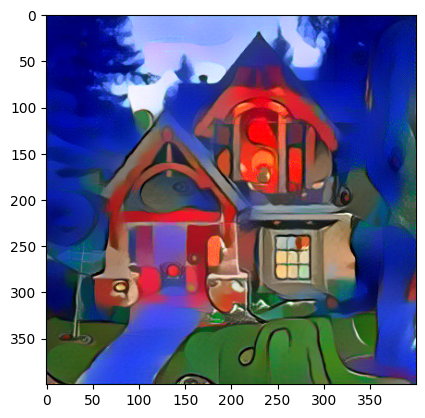

Total loss:  12974313.0


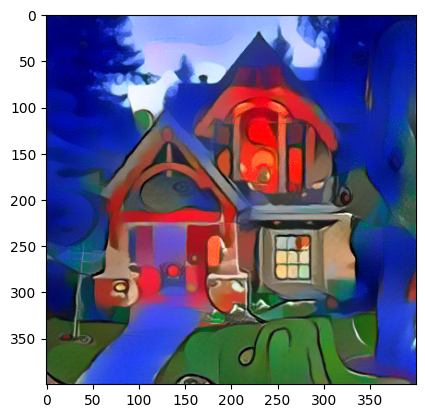

Total loss:  11143337.0


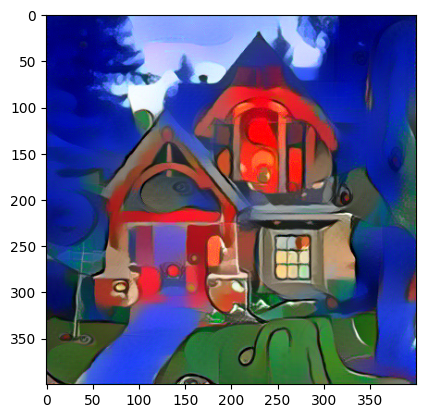

Total loss:  9676533.0


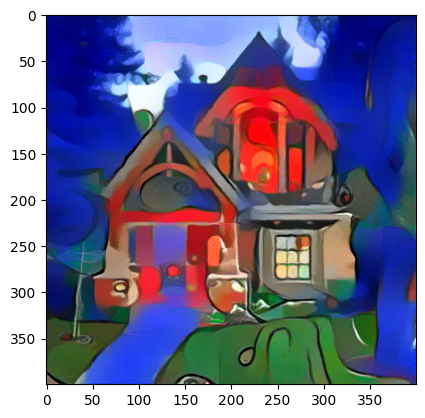

Total loss:  8496507.0


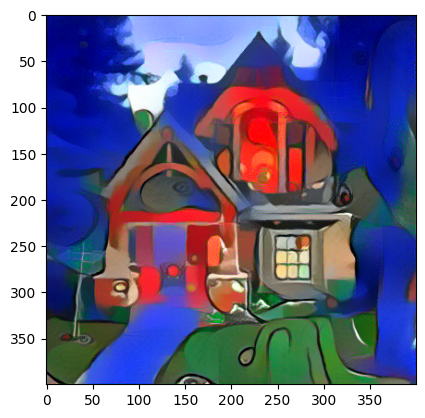

In [15]:
train(style_weights)

In [ ]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)
vgg.to(device)


In [ ]:

content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# Producing the gram matrix for every feature layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# setting the clone of the content image as Target image
target = content.clone().requires_grad_(True).to(device)

In [ ]:
optimizer = optim.Adam([target], lr=lr)
# Other optimizers can be experimented especially the LBFGS optimeizer which can be faster than the Adam

Total loss:  657980608.0


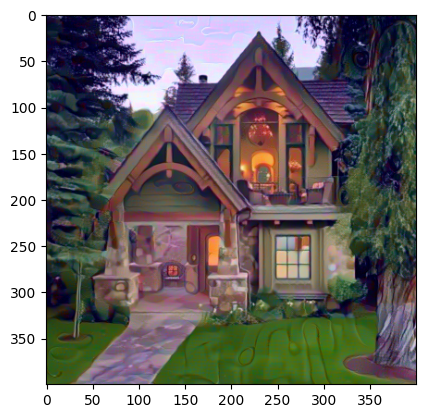

Total loss:  191210608.0


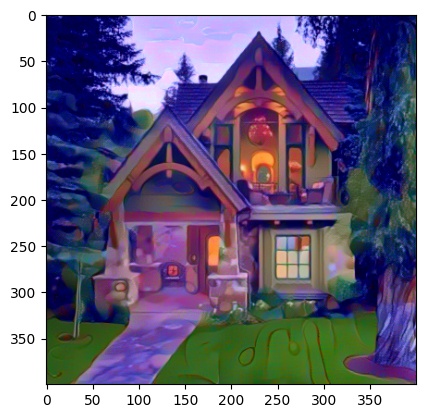

Total loss:  52251104.0


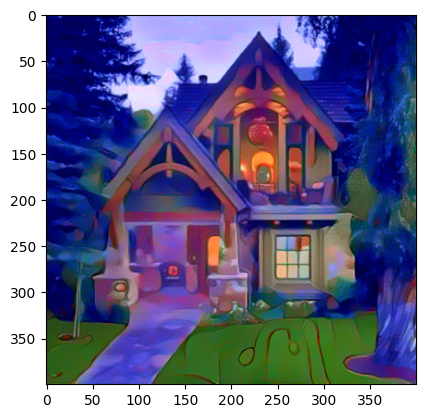

Total loss:  31800526.0


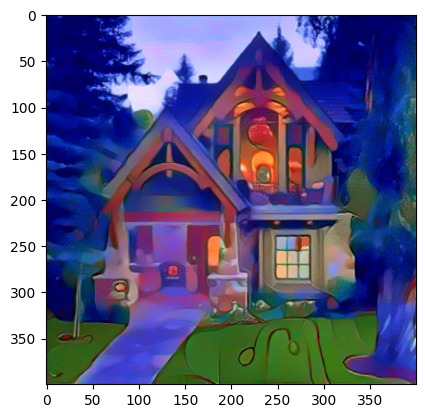

Total loss:  22661834.0


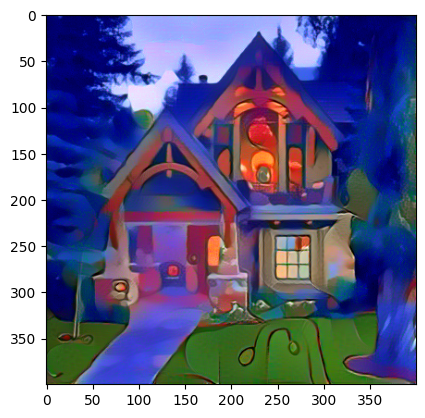

Total loss:  16248986.0


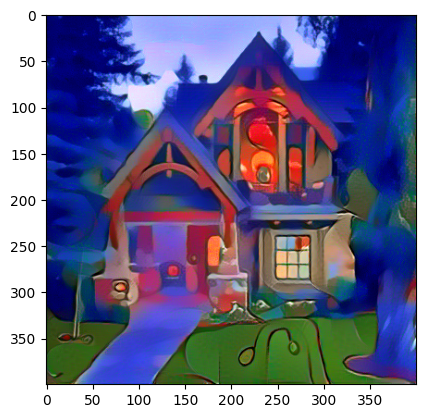

Total loss:  11565442.0


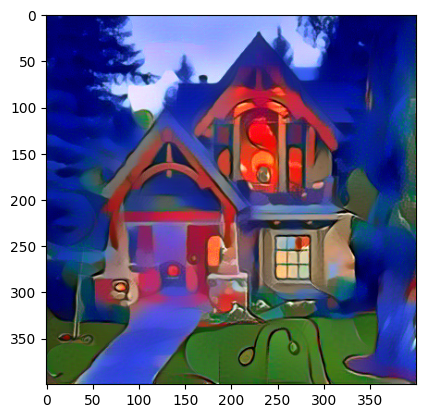

Total loss:  8349982.5


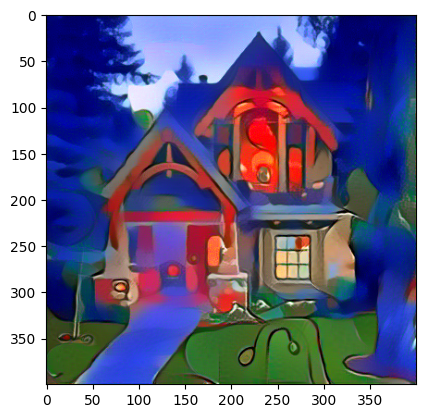

In [15]:
# Setting new hyperparams
show = 500
steps = 4000
lr=0.001
optimizer.zero_grad()
style_weights = {'conv1_1': 1.0,
                 'conv2_1': 0.8,
                 'conv3_1': 0.5,
                 'conv4_1': 0.3,
                 'conv5_1': 0.1}

content_weight = 1 #aplha
style_weight = 1e6 #Beta
train(style_weights)

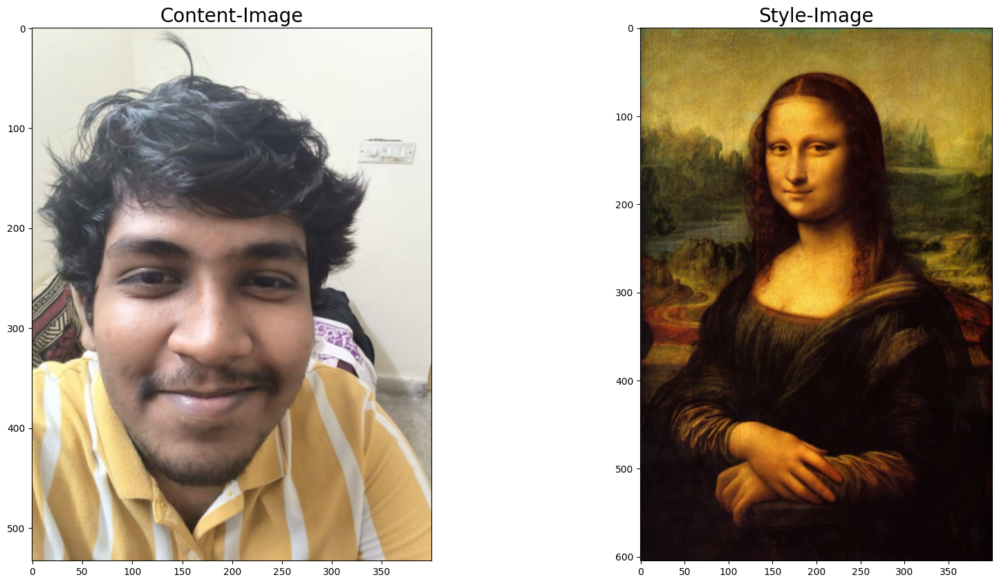

In [16]:
style = load_image("Mona_Lisa.jpg").to(device)
content  = load_image("ashish.jpg").to(device)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title("Content-Image",fontsize = 20)
ax2.imshow(im_convert(style))
ax2.set_title("Style-Image", fontsize = 20)
plt.show()

In [ ]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)
vgg.to(device)


In [18]:

content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# Producing the gram matrix for every feature layer
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# setting the clone of the content image as Target image
target = content.clone().requires_grad_(True).to(device)

In [19]:
show = 400
steps = 3000
lr=0.001
style_weights = {'conv1_1': 0.8,
                 'conv2_1': 0.5,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 0.01 #aplha
style_weight = 1e7 #Beta

In [20]:
optimizer = optim.Adam([target], lr=lr)
# Other optimizers can be experimented especially the LBFGS optimeizer which can be faster than the Adam

Total loss:  415709728.0


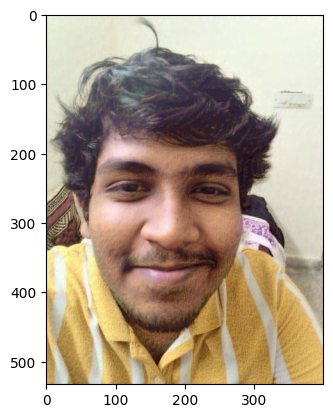

Total loss:  283771328.0


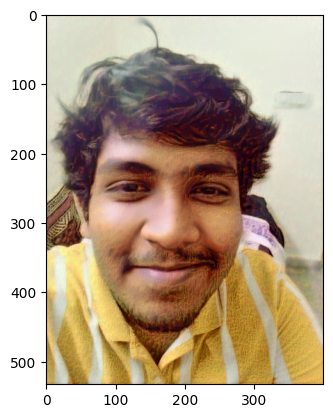

Total loss:  189109008.0


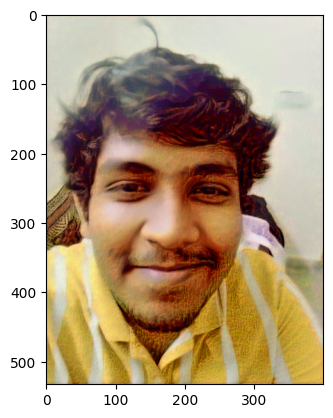

Total loss:  133757104.0


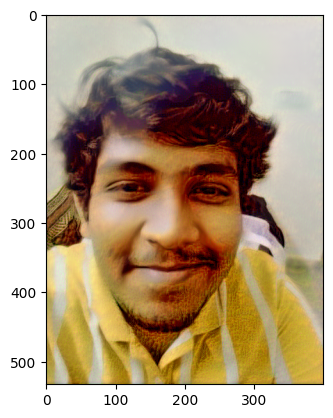

Total loss:  101548824.0


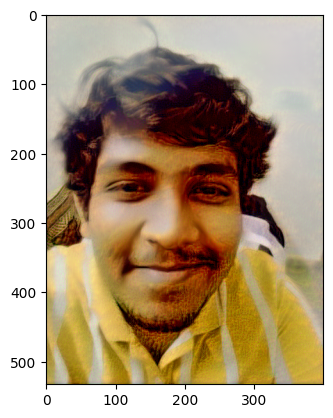

Total loss:  80954000.0


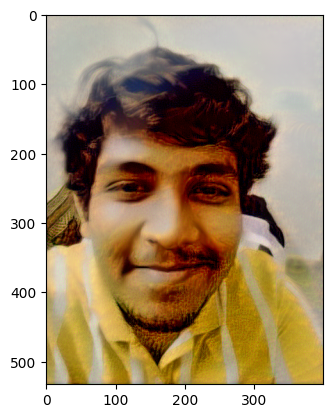

Total loss:  66675660.0


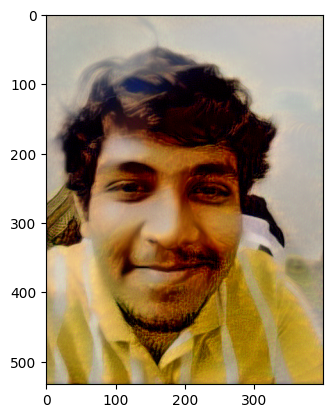

In [21]:
train(style_weights)

## Potential Improvements
* This model can only take static input it is not designed for temporal coherence
* Some advanced Neural nets can be used such as Transformer based Neural nets
* Image segmentation can also be used for the imporved styling and for more human eye plausible output.